## Partie 2 : Data visualisation et analyse

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_theme()
plt.style.use("seaborn-poster")
data_exploitable = pd.read_excel('./data_exploitable.xls', index_col=0)

In [2]:
#data_exploitable = data_exploitable.drop(data_exploitable.sort_values(by=["P13_POP"]).tail(5).index, axis = 0)
#data_exploitable.reset_index(inplace=True)

In [3]:
#data_exploitable.pivot_table("Choix A", columns='voting_result', aggfunc='sum', index='Code du département', fill_value=0).sort_values(by=1)

In [4]:
#Sigma Clipping 
q = np.percentile(data_exploitable.P13_POP, [25, 50, 75])
mv = q[1]
sigma = 0.74 * (q[2] - q[0])

In [5]:
print(mv, sigma)

539.0 742.59


In [6]:
data_exploitable_oringinal = data_exploitable.copy()
data_exploitable = data_exploitable_oringinal[( data_exploitable.P13_POP > mv - 5.0 * sigma )  & (data_exploitable.P13_POP < mv + 5.0 * sigma)]

***

### <font color='blue'> Figure groupe 1 : lois des distributions des variables </font>

**<font color='blue'>Fig.1-1 : distribution du nombre de votes en fonction du choix.</font>**

* Le nombre de choix A pour la plupart des communes est généralement inférieur au choix B.
* La moyenne des choix A est plus faible que celle des choix B.
* Nous pouvons donc déduire que le résultat du référendum est choix B.

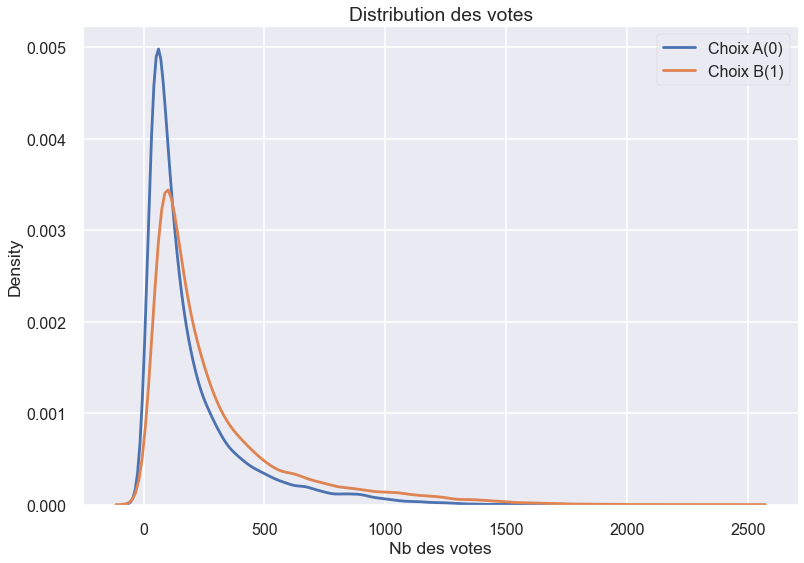

In [7]:
ax = sns.kdeplot(data_exploitable['Choix A'], label="Choix A(0)")
ax = sns.kdeplot(data_exploitable['Choix B'], label="Choix B(1)")
ax.set(title="Distribution des votes", xlabel="Nb des votes")
ax.legend()
#ax.set_xlim(0, 100000)

***

**<font color='blue'>Fig. 1-2 : distributions des parts des abstention et des votes en blanc et nul, en %<font>**
* la plupart des communes ont activement participé au référendum selon le taux d'inscription 
* le pourcentage d'abstentions n'est pas très élevé pour ce référendum et le pourcentage des votes blancs et nuls est faible. Cela signifie que le résultat du référendum est plausible et représente la réalité des opinions publiques.  
* une minorité de communes a un taux de plus 40% de populations qui ont voté pour A.


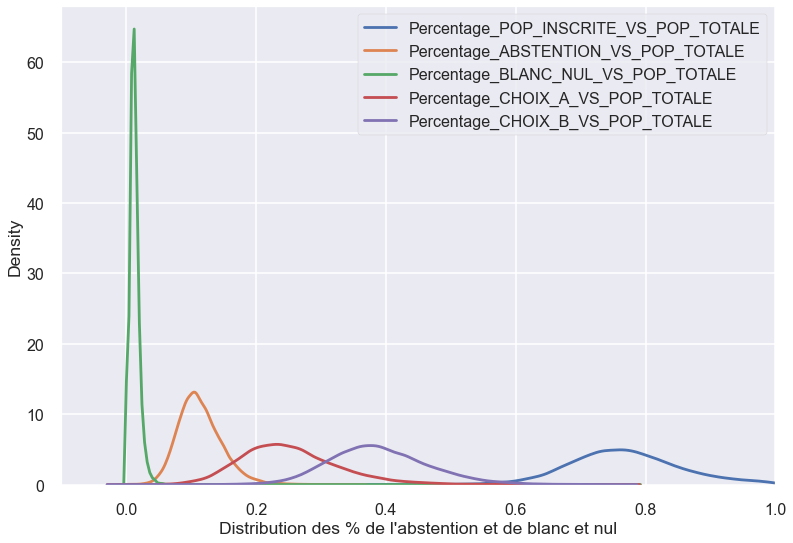

In [8]:
ax = sns.kdeplot(data_exploitable['Percentage_INSCRITE_VS_POP_TOTAL'], label="Percentage_POP_INSCRITE_VS_POP_TOTALE")
ax = sns.kdeplot(data_exploitable['Percentage_ABSTENTION_VS_POP_TOTAL'], label="Percentage_ABSTENTION_VS_POP_TOTALE")
ax = sns.kdeplot(data_exploitable['Percentage_BlANC_NUL_VS_POP_TOTAL'], label="Percentage_BLANC_NUL_VS_POP_TOTALE")
ax = sns.kdeplot(data_exploitable['Percentage_CHOIX_A_VS_POP_TOTAL'], label="Percentage_CHOIX_A_VS_POP_TOTALE")
ax = sns.kdeplot(data_exploitable['Percentage_CHOIX_B_VS_POP_TOTAL'], label="Percentage_CHOIX_B_VS_POP_TOTALE")
ax.set(xlabel="Distribution des % de l'abstention et de blanc et nul")
ax.set_xlim(-0.1,1)
ax.legend()

***

**<font color='blue'>Fig. 1-3 : distributions des classes sociales<font>**
* La distribution la plus étendue est "les retraités".
* La plupart des communes ont moins 10% de "Cadres et Professions intellectuelles supérieures"
* Les agriculteurs sont moins représentés que les autres catégories. 


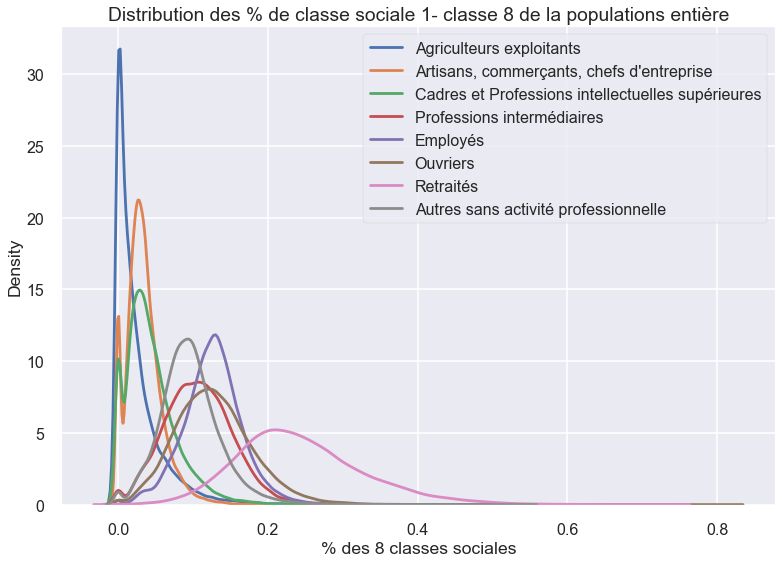

In [9]:
ax = sns.kdeplot(data_exploitable['Percentage_CS_FEMME_HOMME_16PLUS_CS1_VS_POP_TOTAL'], label="Agriculteurs exploitants")
ax = sns.kdeplot(data_exploitable['Percentage_CS_FEMME_HOMME_16PLUS_CS2_VS_POP_TOTAL'], label="Artisans, commerçants, chefs d'entreprise")
ax = sns.kdeplot(data_exploitable['Percentage_CS_FEMME_HOMME_16PLUS_CS3_VS_POP_TOTAL'], label="Cadres et Professions intellectuelles supérieures")
ax = sns.kdeplot(data_exploitable['Percentage_CS_FEMME_HOMME_16PLUS_CS4_VS_POP_TOTAL'], label="Professions intermédiaires")
ax = sns.kdeplot(data_exploitable['Percentage_CS_FEMME_HOMME_16PLUS_CS5_VS_POP_TOTAL'], label="Employés")
ax = sns.kdeplot(data_exploitable['Percentage_CS_FEMME_HOMME_16PLUS_CS6_VS_POP_TOTAL'], label="Ouvriers")
ax = sns.kdeplot(data_exploitable['Percentage_CS_FEMME_HOMME_16PLUS_CS7_VS_POP_TOTAL'], label="Retraités")
ax = sns.kdeplot(data_exploitable['Percentage_CS_FEMME_HOMME_16PLUS_CS8_VS_POP_TOTAL'], label="Autres sans activité professionnelle")


ax.set(title="Distribution des % de classe sociale 1- classe 8 de la populations entière", xlabel="% des 8 classes sociales")
ax.legend()

***
**<font color='blue'>Fig. 1-4 : distributions des niveaux de diplôme<font>**

0 -- Aucun diplôme \
1 -- Diplôme de niveau CEP, Certificat d'études primaires, Niveau1\
2 -- Diplôme de niveau BEPC, Diplôme national du brevet, niveau3 \
3 -- Diplôme de niveau CAP-BEP, certificat d’aptitude professionnelle (CAP) ou brevet d’études professionnelles (BEP), niveau3\
4 -- Diplôme de niveau bac général ou technique, Baccalauréat, niveau4\
5 -- Diplôme universitaire de 1er cycle, BTS, DUT, licence, Niveau5-6\
6 -- Diplôme universitaire du 2ème cycle, master, niveau7

* les diplômés du niveau 3 sont les plus étendus
* la population sans diplôme pour certaines communes est non négligeable. 
* la plupart des populations ont le diplôme du brevet. 
* la plupart des communes ont moins de 20% de diplômés de niveau master. 

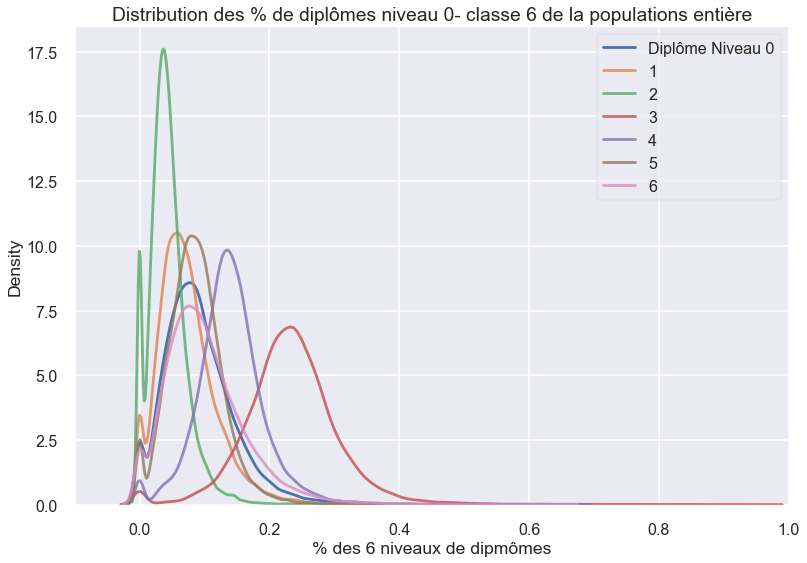

In [10]:
alpha = 0.8
ax = sns.kdeplot(data_exploitable['Percentage_DIP_FEMME_HOMME_16PLUS_N0_VS_POP_TOTAL'], label="Diplôme Niveau 0")
ax = sns.kdeplot(data_exploitable['Percentage_DIP_FEMME_HOMME_16PLUS_N1_VS_POP_TOTAL'], label="1", alpha=alpha)
ax = sns.kdeplot(data_exploitable['Percentage_DIP_FEMME_HOMME_16PLUS_N2_VS_POP_TOTAL'], label="2", alpha=alpha)
ax = sns.kdeplot(data_exploitable['Percentage_DIP_FEMME_HOMME_16PLUS_N3_VS_POP_TOTAL'], label="3", alpha=alpha)
ax = sns.kdeplot(data_exploitable['Percentage_DIP_FEMME_HOMME_16PLUS_N4_VS_POP_TOTAL'], label="4", alpha=alpha)
ax = sns.kdeplot(data_exploitable['Percentage_DIP_FEMME_HOMME_16PLUS_N5_VS_POP_TOTAL'], label="5", alpha=alpha)
ax = sns.kdeplot(data_exploitable['Percentage_DIP_FEMME_HOMME_16PLUS_N6_VS_POP_TOTAL'], label="6", alpha=alpha)

ax.set_xlim(-0.1,1)

ax.set(title="Distribution des % de diplômes niveau 0- classe 6 de la populations entière", xlabel="% des 6 niveaux de dipmômes")
ax.legend()

***
**<font color='blue'>Fig. 1-5 : distribution de la population totale<font>**

* On constate une distribution à queue lourde.
* Beaucoup de communes ont moins de 2000 habitants.

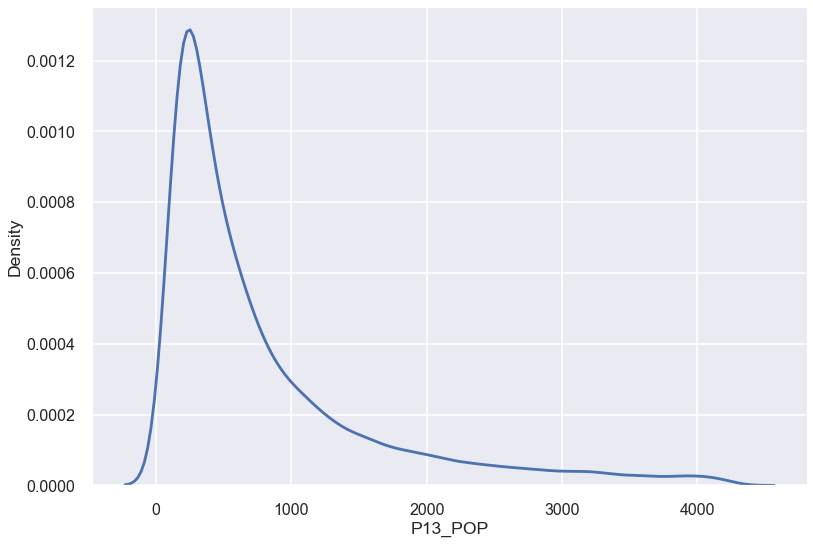

In [11]:
ax = sns.kdeplot(data_exploitable['P13_POP'])

### <font color='blue'>Figure groupe 2 : influences du niveau de diplôme, du revenu médian, et de la classe sociale<font>

***
**<font color='blue'>Fig. 2-1 : revenu médian par catétorie de choix<font>**

Nous avons constaté que : 
* la plupart des communes ayant choisi B ont leur revenu médian plus élevé que les autres communes.
* les communes les plus riches ont toutes choisi le B, et l'inverse est vrai pour les communes les moins riches. 
* la disparité du revenu médian pour les communes ayant choisi B est plus important que celles choisissant A.  


[Text(0, 0, 'Choix A'), Text(1, 0, 'Choix B')]

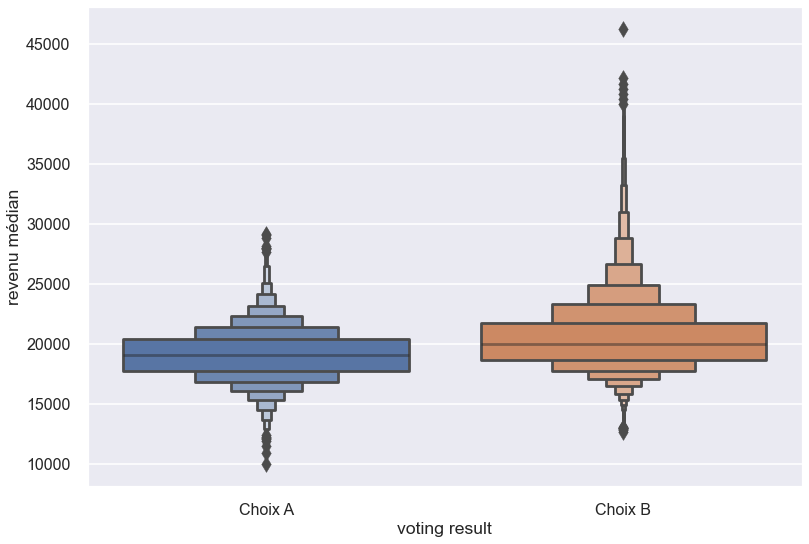

In [12]:
g = sns.boxenplot(x= "voting_result", y="MED13", data=data_exploitable)
g.set_xlabel("voting result");
g.set_ylabel("revenu médian")
g.set_xticklabels(["Choix A","Choix B"])

***
**<font color='blue'>Fig. 2-2 revenu médian en fonction du niveau de diplôme<font>**

* les communes qui ont une population dont 15.5-25% ont un diplôme niveau master ont une médiane du revenu médian le plus élevé.
* les revenus médians sont relativement comparables pour les populations ayant le même niveau de diplôme au niveau national. 
* Pour les sans diplôme, et niveaux 1-4, plus leurs parts sont importantes, plus la médiane du revenu médian des communes sont faible. L'inverse est vrai pour le niveau 5 et 6. 

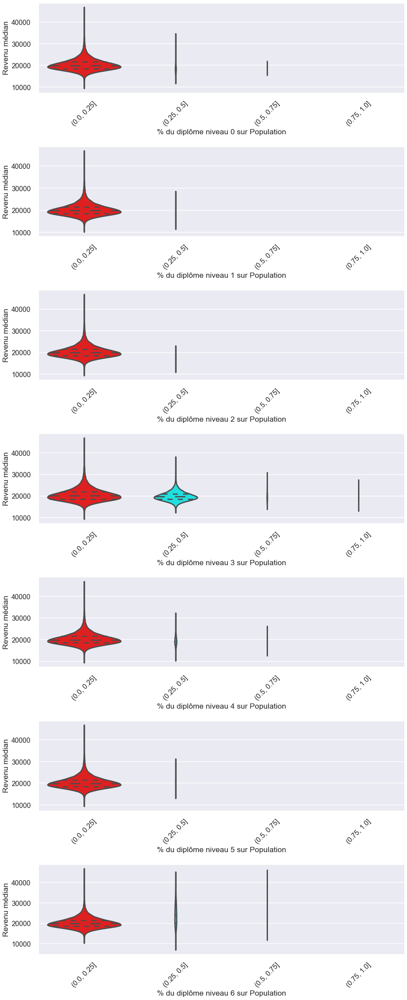

In [13]:
fig, ax = plt.subplots(7, 1, figsize=(15, 40))
fig.subplots_adjust(hspace=0.6, wspace=0.4)

l = np.linspace(0, 1, num = 5)
for i in np.arange(7):
#    dip_min = data_exploitable['Percentage_DIP_FEMME_HOMME_16PLUS_N'+str(i)+'_VS_POP_TOTAL'].min()
#   dip_max = data_exploitable['Percentage_DIP_FEMME_HOMME_16PLUS_N'+str(i)+'_VS_POP_TOTAL'].max()
#    l = np.linspace(dip_min, dip_max, num=10)
    dip_cat = pd.cut(data_exploitable['Percentage_DIP_FEMME_HOMME_16PLUS_N'+str(i)+'_VS_POP_TOTAL'], l)
    g = sns.violinplot(ax=ax[i], x=dip_cat, y="MED13", 
                       #hue="voting_result", 
                       data=data_exploitable,
                   scale = "count",
                   #split=True, 
                       inner="quartile",
                 palette=["red", "cyan"]);   
    g.set_xticklabels(g.get_xticklabels(),rotation = 45)
    g.set_xlabel("% du diplôme niveau " +str(i)+" sur Population")
    g.set_ylabel("Revenu médian")
    
    #ax[i].legend()
    #ax[i].xaxis.set_major_locator(plt.MaxNLocator(30))
    #ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation = 90)


***
**<font color='blue'>Fig. 2-3 : population en fonction du revenu médian par catégorie de choix<font>**

* les communes ayant un révenu médian de plus de 33KEUR ont toutes voté pour B. 
* pour les communes modestes, il n'y a pas de préférence entre le choix entre A et B.
* la population des communes les plus pauvres n'est pas élevée. 

10021.25 46250.5555555556


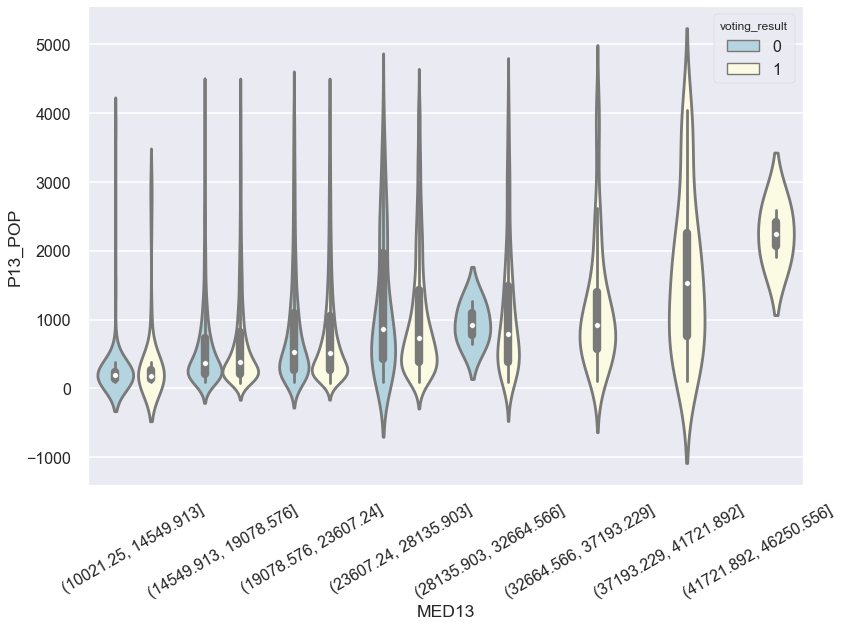

In [14]:
median_min = data_exploitable["MED13"].min()
median_max = data_exploitable["MED13"].max()
print(median_min,median_max)
l = np.linspace(median_min, median_max, num = 9)
median_cat = pd.cut(data_exploitable.MED13, l)

with sns.axes_style(style=None):
    ax = sns.violinplot(x=median_cat, y="P13_POP", hue="voting_result", data=data_exploitable,
                     palette=["lightblue", "lightyellow"]);
    
    ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)

***
**<font color='blue'>Fig. 2-4 : répartition des choix A et B ainsi que leurs population et revenu médian<font>**
* Les plupart des communes ont bien choisi B. 
* les communes riches ont plus tendance à choisir B. 
* nous pourrions en déduire que le choix B est plus favorable aux populations les plus riches. 

Text(0, 0.5, 'Choix B')

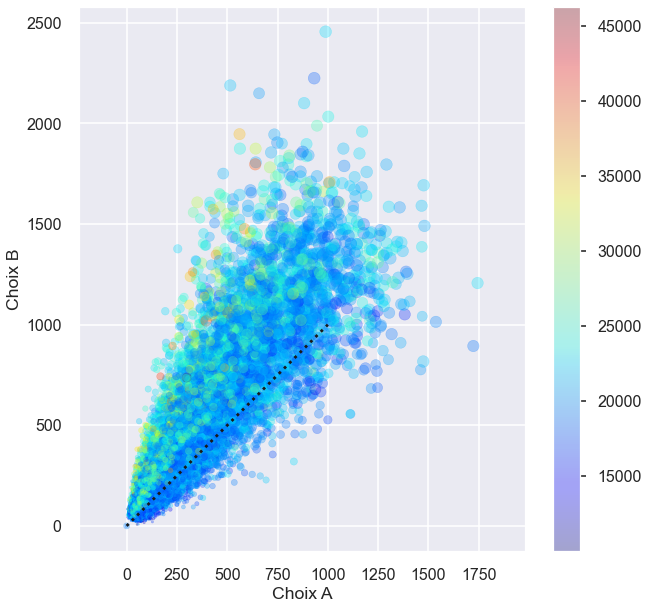

In [15]:
# Figure to keep. shows the voting results of cities, their median revenu and population. 
f, ax = plt.subplots(figsize=(10, 10))
plt.scatter(data_exploitable['Choix A'], data_exploitable['Choix B'], \
             s = data_exploitable['P13_POP'] / 30,\
             c = data_exploitable['MED13'].astype(int), alpha=0.3, cmap='jet')
plt.axis('equal')
plt.colorbar()
plt.plot(np.linspace(0, 1000),np.linspace(0, 1000), ':k')
plt.xlabel('Choix A')
plt.ylabel('Choix B')

***
**<font color='blue'>Fig. 2-5 : revenu médian par rapport aux communes ayant voté pour A<font>**
* les communes les plus riches ont très peu de populations qui ont choisi A. 
* les communes qui ont choisi A possèdent un revenu médian inférieur à 25000EUR.  

Text(0, 0.5, 'Revenu médian')

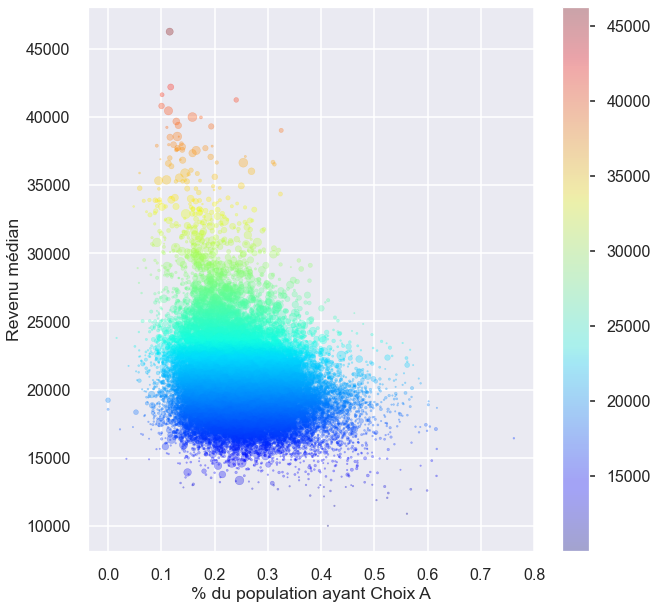

In [16]:
# Figure to keep. 
f, ax = plt.subplots(figsize=(10, 10))
plt.scatter(data_exploitable['Percentage_CHOIX_A_VS_POP_TOTAL'], data_exploitable['MED13'], \
            s = data_exploitable['P13_POP'] / 50, \
            c = data_exploitable['MED13'], alpha=0.3, cmap='jet')
plt.colorbar()
plt.xlabel("% du population ayant Choix A")
plt.ylabel("Revenu médian")

***
**<font color='blue'>Fig. 2-6 : nombre d'abstentions et nombre de blancs et nuls<font>**
* Pour toutes les communes, parmi les inscrits, le nombre d'abstentions est considérablement plus faible que celui des votes blancs et nuls.
* Cela est vrai y compris pour les communes les plus aisées. 

Text(0, 0.5, 'Nb des Blancs et nuls')

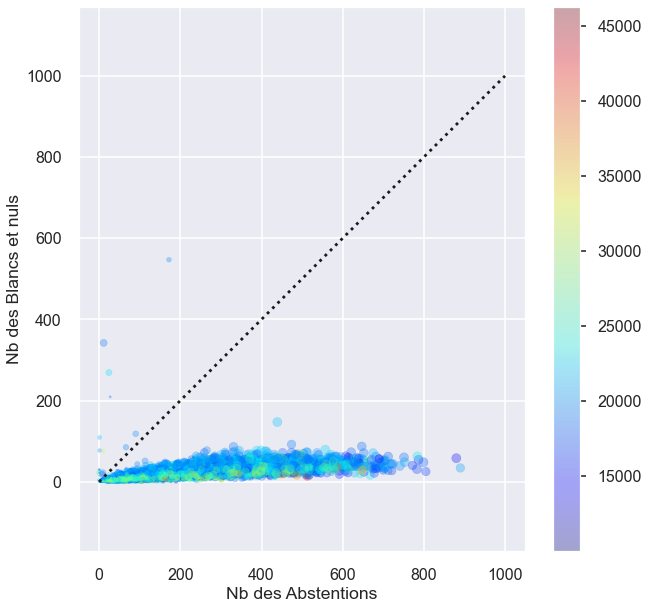

In [17]:
# Figure to keep.
f, ax = plt.subplots(figsize=(10, 10))
plt.scatter(data_exploitable['Abstentions'], data_exploitable['Blancs et nuls'], \
            s = data_exploitable['P13_POP'] / 50, \
            c = data_exploitable['MED13'], alpha=0.3, cmap='jet')

plt.axis('equal')
plt.colorbar()
plt.plot(np.linspace(0, 1000),np.linspace(0, 1000), ':k')
plt.xlabel("Nb des Abstentions")
plt.ylabel("Nb des Blancs et nuls")

***
**<font color='blue'>Fig. 2-7 : Influence de la classe sociale sur le choix final<font>**
* Dans chaque département, les deux groupes de communes divisées par leurs choix, A ou B, ont quasiment le même pourcentage de population de la classe agriculteurs. Cela peut s'interpréter tel que les agriculteurs n'ont pas réellement de préférence entre le choix A et B. 
* Nous avons constaté le même phénomène pour la classe Artisan, commerçants et chef d'entreprise. 

* Les cadres et les professions intellectuelles supérieures ont tendance à effectuer le même choix dès que leur part dans la population d'une commune devient importante. Dans notre cas, c'est le choix B. Cette observation s'applique aussi à la classe professions intermédiaires.

* Pour les classes Employés, ouvriers, Retraités et autres sans activité professionelle, même si leurs populations deviennent grandes au sein de leurs communes, ils votent sans biais pour les deux choix (A ou B). 


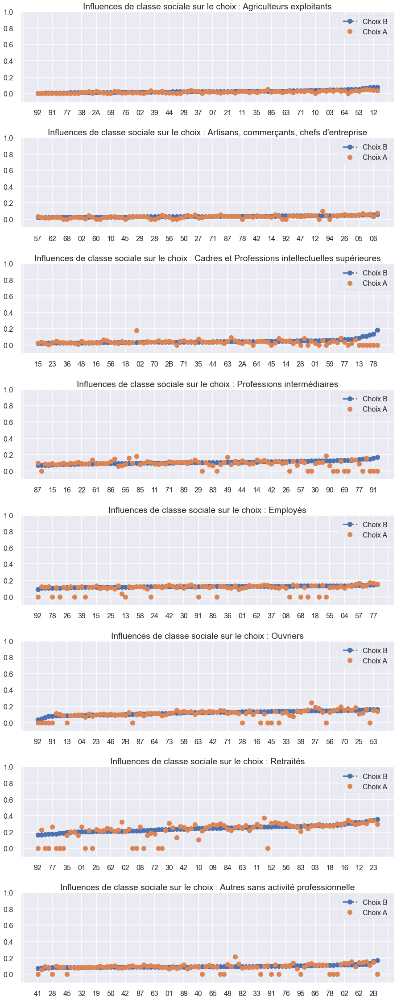

In [18]:

fig, ax = plt.subplots(8, 1, figsize=(15, 40))
fig.subplots_adjust(hspace=0.4, wspace=0.4)


for i in np.arange(8):
    cb = data_exploitable.pivot_table('Percentage_CS_FEMME_HOMME_16PLUS_CS'+str(i+1)+'_VS_POP_TOTAL', 
                                            columns='Code du département', index='voting_result',
                                            fill_value=0, aggfunc='mean').T.iloc[:,1].sort_values()
    ca = data_exploitable.pivot_table('Percentage_CS_FEMME_HOMME_16PLUS_CS'+str(i+1)+'_VS_POP_TOTAL', 
                                            columns='Code du département', index='voting_result',
                                            fill_value=0, aggfunc='mean').T.iloc[:,0]   
    ax[i].plot(cb, label='Choix B', marker='o', linestyle="--")
    ax[i].plot(ca, label='Choix A', marker='o', linestyle='none') 

   
    ax[i].legend()
    ax[i].xaxis.set_major_locator(plt.MaxNLocator(30))
    ax[i].set_ylim([-0.1, 1])
    
ax[0].title.set_text('Influences de classe sociale sur le choix' + ' : ' + "Agriculteurs exploitants")    
ax[1].title.set_text('Influences de classe sociale sur le choix' + ' : ' + "Artisans, commerçants, chefs d'entreprise")
ax[2].title.set_text('Influences de classe sociale sur le choix' + ' : ' + "Cadres et Professions intellectuelles supérieures")
ax[3].title.set_text('Influences de classe sociale sur le choix' + ' : ' + "Professions intermédiaires")
ax[4].title.set_text('Influences de classe sociale sur le choix' + ' : ' + "Employés")
ax[5].title.set_text('Influences de classe sociale sur le choix' + ' : ' + "Ouvriers")
ax[6].title.set_text('Influences de classe sociale sur le choix' + ' : ' + "Retraités")
ax[7].title.set_text('Influences de classe sociale sur le choix' + ' : ' + "Autres sans activité professionnelle")



In [19]:
data_exploitable.pivot_table('Percentage_CS_FEMME_HOMME_16PLUS_CS1_VS_POP_TOTAL', 
                                            columns='Code du département', index='voting_result',
                                            fill_value=0, aggfunc='mean').T

voting_result,0,1
Code du département,,
01,0.012613,0.013035
02,0.008570,0.018150
03,0.037668,0.042377
04,0.036814,0.022796
05,0.023219,0.026972
...,...,...
90,0.000000,0.005864
91,0.000000,0.005499
92,0.000000,0.000000


In [20]:
median_min = data_exploitable["MED13"].min()
median_max = data_exploitable["MED13"].max()
print(median_min,median_max)
l = np.linspace(median_min, median_max, num = 9)


10021.25 46250.5555555556


### <font color='blue'>Figure groupe 3 : corrélations des variables explicatives et variables expliquées<font>

***
**<font color='blue'>Fig. 3-1 corrélation matrix des variables<font>**
* En analysant la matrice de corrélation (version pdf plus lisible), nous avons constaté que les choix (A ou B) ont des corrélations considérables avec les niveaux de diplômes et les classe sociales. 

In [21]:
corr=data_exploitable.corr()

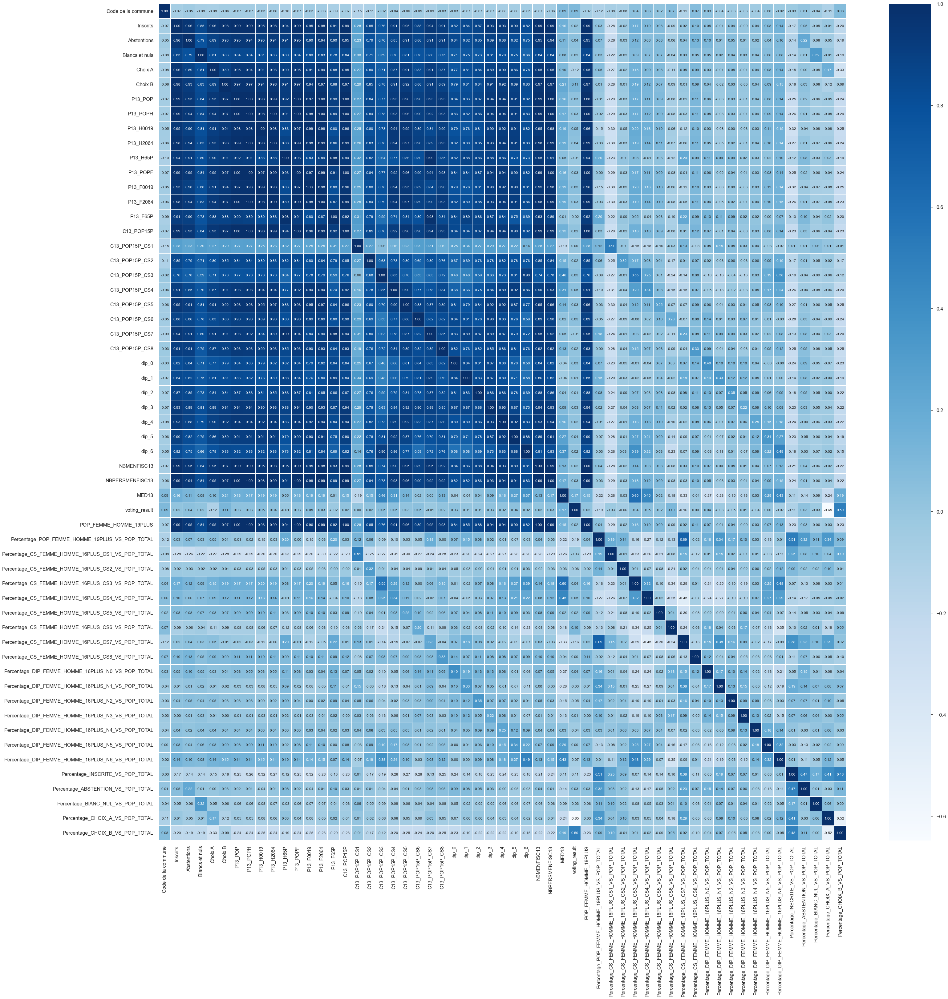

In [22]:
fig, ax = plt.subplots(figsize = (50,50))
ax = sns.heatmap(corr,
                 annot=True,
                 linewidths=2,
                 fmt=".2f",
                 cmap='Blues');
fig.savefig("corr.pdf")

***
**<font color='blue'>Fig. 3-2 corrélation entre les choix et les niveaux de diplômes ainsi que les classes sociales<font>**
* Nous avons donc tracé une courbe afin de déterminer la magnitude des corrélations. 
* La corrélation positive la plus importante est avec la classe sociale 3, Cadres et Professions intellectuelles supérieures. 
* La corrélation négative la plus importante est avec la classe sociale 1, Algriculteurs.

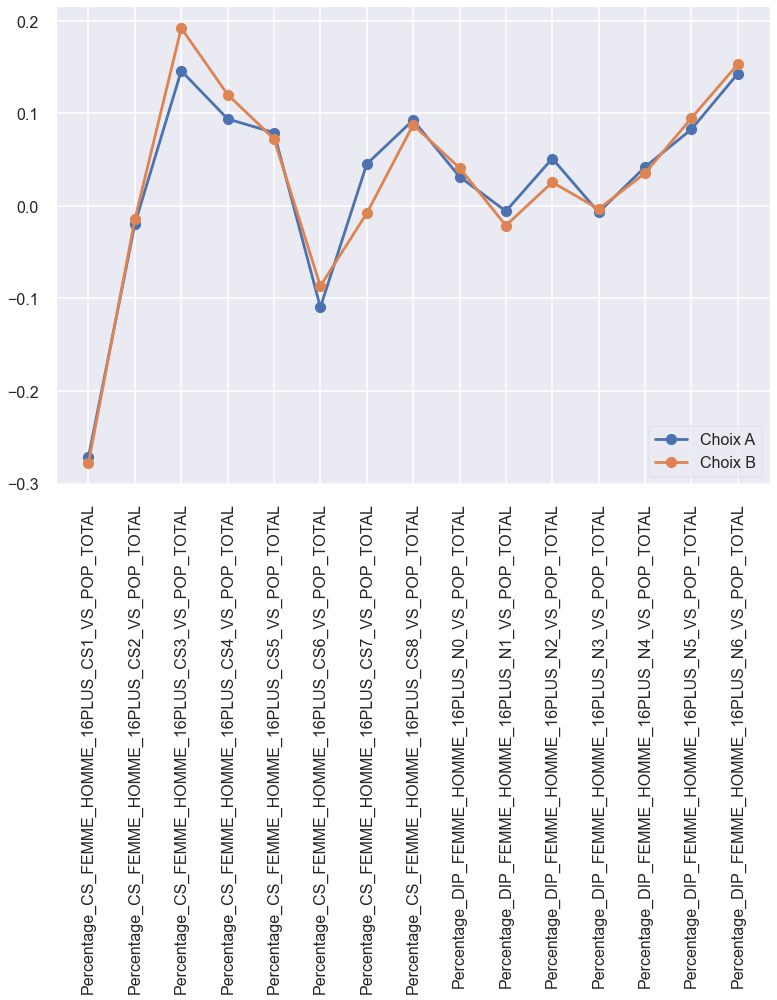

In [23]:
fig= plt.figure()
ax = plt.axes()
x = corr.loc["Percentage_CS_FEMME_HOMME_16PLUS_CS1_VS_POP_TOTAL" : "Percentage_DIP_FEMME_HOMME_16PLUS_N6_VS_POP_TOTAL":,'Choix A']
y = corr.loc["Percentage_CS_FEMME_HOMME_16PLUS_CS1_VS_POP_TOTAL" : "Percentage_DIP_FEMME_HOMME_16PLUS_N6_VS_POP_TOTAL":,'Choix B']
plt.plot(x, "o-", label="Choix A")
plt.plot(y, "o-", label="Choix B")
label = ["% CS1", "% CS2", "% CS3"]
plt.legend()
plt.tick_params(axis='x', labelrotation=90)

#ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


### <font color='blue'>Figure groupe 4, Carte choroplèthe mapping les réultats des votes.<font>

In [24]:
import geoviews as gv
import geoviews.feature as gf
import xarray as xr
from cartopy import crs
import geopandas as gpd

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
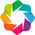

In [25]:
gv.extension('bokeh')

In [26]:
import geopandas as gpd

In [27]:
sf = gpd.read_file('./geojson/france-geojson/departements-version-simplifiee.geojson')
sf.head()

,code,nom,geometry
0,01,Ain,"POLYGON ((4.78021 46.17668, 4.79458 46.21832, ..."
1,02,Aisne,"POLYGON ((4.04797 49.40564, 4.03991 49.39740, ..."
2,03,Allier,"POLYGON ((3.03207 46.79491, 3.04907 46.75808, ..."
3,04,Alpes-de-Haute-Provence,"POLYGON ((5.67604 44.19143, 5.69209 44.18648, ..."
4,05,Hautes-Alpes,"POLYGON ((6.26057 45.12685, 6.29922 45.10855, ..."


In [28]:
sf[(sf.nom == "Paris")]


,code,nom,geometry
75,75,Paris,"POLYGON ((2.41634 48.84924, 2.46226 48.84254, ..."


In [29]:
data_exploitable_oringinal[(data_exploitable_oringinal["Libellé du département"] == "PARIS")]

,Code du département,Libellé du département,Code de la commune,Libellé de la commune,Inscrits,Abstentions,Blancs et nuls,Choix A,Choix B,CODGEO,...,Percentage_DIP_FEMME_HOMME_16PLUS_N2_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N3_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N4_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N5_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N6_VS_POP_TOTAL,Percentage_INSCRITE_VS_POP_TOTAL,Percentage_ABSTENTION_VS_POP_TOTAL,Percentage_BlANC_NUL_VS_POP_TOTAL,Percentage_CHOIX_A_VS_POP_TOTAL,Percentage_CHOIX_B_VS_POP_TOTAL
25605,75,PARIS,56,Paris,1253322,248755,12093,506594,485880,75056,...,0.024761,0.051265,0.087152,0.055578,0.389597,0.562123,0.111568,0.005424,0.227211,0.21792


In [30]:
sf_new = pd.merge(sf, data_exploitable_oringinal, 
                     how = 'inner', 
                     right_on='Code du département',
                 left_on = "code")


In [31]:
sf_new[(sf_new.code == "75")]

,code,nom,geometry,Code du département,Libellé du département,Code de la commune,Libellé de la commune,Inscrits,Abstentions,Blancs et nuls,...,Percentage_DIP_FEMME_HOMME_16PLUS_N2_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N3_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N4_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N5_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N6_VS_POP_TOTAL,Percentage_INSCRITE_VS_POP_TOTAL,Percentage_ABSTENTION_VS_POP_TOTAL,Percentage_BlANC_NUL_VS_POP_TOTAL,Percentage_CHOIX_A_VS_POP_TOTAL,Percentage_CHOIX_B_VS_POP_TOTAL
25605,75,Paris,"POLYGON ((2.41634 48.84924, 2.46226 48.84254, ...",75,PARIS,56,Paris,1253322,248755,12093,...,0.024761,0.051265,0.087152,0.055578,0.389597,0.562123,0.111568,0.005424,0.227211,0.21792


In [32]:
sf_new

,code,nom,geometry,Code du département,Libellé du département,Code de la commune,Libellé de la commune,Inscrits,Abstentions,Blancs et nuls,...,Percentage_DIP_FEMME_HOMME_16PLUS_N2_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N3_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N4_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N5_VS_POP_TOTAL,Percentage_DIP_FEMME_HOMME_16PLUS_N6_VS_POP_TOTAL,Percentage_INSCRITE_VS_POP_TOTAL,Percentage_ABSTENTION_VS_POP_TOTAL,Percentage_BlANC_NUL_VS_POP_TOTAL,Percentage_CHOIX_A_VS_POP_TOTAL,Percentage_CHOIX_B_VS_POP_TOTAL
0,01,Ain,"POLYGON ((4.78021 46.17668, 4.79458 46.21832, ...",01,AIN,1,L'Abergement-Clémenciat,592,84,9,...,0.070404,0.187744,0.147327,0.091265,0.097784,0.771838,0.109518,0.011734,0.200782,0.449804
1,01,Ain,"POLYGON ((4.78021 46.17668, 4.79458 46.21832, ...",01,AIN,2,L'Abergement-de-Varey,215,36,5,...,0.021186,0.173729,0.241525,0.105932,0.127119,0.911017,0.152542,0.021186,0.279661,0.457627
2,01,Ain,"POLYGON ((4.78021 46.17668, 4.79458 46.21832, ...",01,AIN,4,Ambérieu-en-Bugey,8205,1698,126,...,0.045477,0.204123,0.139982,0.088655,0.105439,0.571419,0.118253,0.008775,0.189219,0.255171
3,01,Ain,"POLYGON ((4.78021 46.17668, 4.79458 46.21832, ...",01,AIN,5,Ambérieux-en-Dombes,1152,170,18,...,0.058140,0.249694,0.151775,0.090575,0.108323,0.705018,0.104039,0.011016,0.171359,0.418605
4,01,Ain,"POLYGON ((4.78021 46.17668, 4.79458 46.21832, ...",01,AIN,6,Ambléon,105,17,1,...,0.000000,0.185185,0.462963,0.000000,0.046296,0.972222,0.157407,0.009259,0.324074,0.481481
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30862,95,Val-d'Oise,"POLYGON ((2.59052 49.07965, 2.57203 49.06149, ...",95,VAL D'OISE,676,Villers-en-Arthies,382,64,5,...,0.030488,0.225610,0.132114,0.121951,0.142276,0.776423,0.130081,0.010163,0.176829,0.459350
30863,95,Val-d'Oise,"POLYGON ((2.59052 49.07965, 2.57203 49.06149, ...",95,VAL D'OISE,678,Villiers-Adam,595,71,4,...,0.041518,0.111507,0.151839,0.161329,0.193357,0.705813,0.084223,0.004745,0.226572,0.390273
30864,95,Val-d'Oise,"POLYGON ((2.59052 49.07965, 2.57203 49.06149, ...",95,VAL D'OISE,680,Villiers-le-Bel,13269,4083,224,...,0.045475,0.135069,0.133897,0.057667,0.075901,0.485830,0.149495,0.008202,0.203061,0.125073
30865,95,Val-d'Oise,"POLYGON ((2.59052 49.07965, 2.57203 49.06149, ...",95,VAL D'OISE,682,Villiers-le-Sec,95,11,0,...,0.067039,0.234637,0.100559,0.128492,0.150838,0.530726,0.061453,0.000000,0.223464,0.245810


In [33]:
sf_new.isna().any().sum()

0

In [34]:
sf_temp1 = sf_new.pivot_table(["Choix A", "Choix B"], index="nom", aggfunc='mean')
sf_temp2 = sf_new.pivot_table(["voting_result"], index="nom", aggfunc='sum')
sf_temp3 = sf_new.pivot_table(["voting_result"], index="nom", aggfunc='count')

In [35]:
sf_temp4 = (sf_temp2 / sf_temp3)
sf_temp4

,voting_result
nom,
Ain,0.992228
Aisne,0.956522
Allier,0.745928
Alpes-Maritimes,0.981308
Alpes-de-Haute-Provence,0.777778
...,...
Vendée,0.981132
Vienne,0.856089
Vosges,0.972637


In [36]:
sf_plot_temp = sf.merge(sf_temp1, how="inner", on="nom" )
sf_plot = sf_plot_temp.merge(sf_temp2['voting_result'], on="nom")
sf_plot

,code,nom,geometry,Choix A,Choix B,voting_result
0,01,Ain,"POLYGON ((4.78021 46.17668, 4.79458 46.21832, ...",296.279793,521.979275,383
1,02,Aisne,"POLYGON ((4.04797 49.40564, 4.03991 49.39740, ...",172.224638,250.015942,660
2,03,Allier,"POLYGON ((3.03207 46.79491, 3.04907 46.75808, ...",312.397394,354.332248,229
3,04,Alpes-de-Haute-Provence,"POLYGON ((5.67604 44.19143, 5.69209 44.18648, ...",327.563492,410.460317,98
4,05,Hautes-Alpes,"POLYGON ((6.26057 45.12685, 6.29922 45.10855, ...",294.966387,380.697479,95
...,...,...,...,...,...,...
91,91,Essonne,"POLYGON ((2.22656 48.77610, 2.23298 48.76620, ...",1434.062176,1659.606218,178
92,92,Hauts-de-Seine,"POLYGON ((2.29097 48.95097, 2.32697 48.94536, ...",9012.444444,11366.777778,25
93,93,Seine-Saint-Denis,"POLYGON ((2.55306 49.00982, 2.58031 48.99159, ...",7916.800000,5431.075000,10
94,94,Val-de-Marne,"POLYGON ((2.33190 48.81701, 2.36395 48.81632, ...",6325.234043,6129.276596,25


In [37]:
(sf_plot["nom"] == "Paris").any()

True

In [38]:
sf_plot = sf_plot.merge(sf_temp4,left_on=sf_plot.nom, right_on=sf_temp4.index)


In [39]:
sf_plot.rename({"voting_result_y": "P_NB_de_communes_choisissant_B"}, axis='columns', inplace=True)

In [40]:
deps = gv.Polygons(sf_plot, vdims=['nom','Choix A','Choix B','P_NB_de_communes_choisissant_B'])


In [41]:
sf.shape

(96, 3)

**<font color='blue'>Fig.4-1 : Carte Choroplèthe<font>**
* La carte métropolitaine de France colorée par les résultats du référendum. 
* Les départements autour de la Corrèze au centre, de l'Ariège près des Pyrénées préfèrent le choix A. 
* les autres départements au nord de la France et autour du Rhône et de la Haut-Savoie, ainsi que les départements près de la Côte d'Azur votent plutôt pour A. 

In [42]:
from geoviews import dim
deps.opts(width=850, height=850, toolbar='above', color=dim('P_NB_de_communes_choisissant_B'),
          colorbar=True, tools=['hover'], aspect='equal', cmap="viridis")

:Polygons   [Longitude,Latitude]   (nom,Choix A,Choix B,P_NB_de_communes_choisissant_B)